In [ ]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision import transforms
from PIL import Image
import os
import matplotlib.pyplot as plt
import torch
from torchvision.ops import nms

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load a pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set the model to inference mode


NameError: name 'fasterrcnn_resnet50_fpn' is not defined

In [ ]:
# Define the transformation
transform = transforms.Compose([
    transforms.ToTensor(),
])

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image = transform(image)
    return image

In [ ]:
def detect_people(image):
    with torch.no_grad():
        predictions = model([image])  # Model expects a list of images
    filtered_boxes = filter_detections(predictions[0])
    return filtered_boxes

In [ ]:
def count_people(boxes):
    return len(boxes)  # Since boxes are already filtered to only include people

In [ ]:

def filter_detections(predictions, min_score=0.8, min_area=500):
    """
    Apply NMS and remove small bounding boxes.

    Args:
        predictions (dict): Output from the detection model.
        min_score (float): Minimum score threshold for considering detections.
        min_area (int): Minimum area threshold for considering bounding boxes.

    Returns:
        List[torch.Tensor]: List of filtered bounding boxes.
    """
    # Filter out predictions below the confidence threshold and calculate areas
    scores = predictions['scores']
    boxes = predictions['boxes']
    labels = predictions['labels']
    areas = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])  # (ymax-ymin)*(xmax-xmin)

    # Filter boxes by score, label (people), and area
    keep = (scores >= min_score) & (labels == 1) & (areas >= min_area)
    filtered_boxes = boxes[keep]
    filtered_scores = scores[keep]

    # Apply Non-Maximum Suppression
    keep_indices = nms(filtered_boxes, filtered_scores, iou_threshold=0.3)
    final_boxes = filtered_boxes[keep_indices]

    return final_boxes


In [ ]:
def show_image_with_boxes(image, boxes):
    plt.figure()
    pil_img = transforms.ToPILImage()(image.squeeze())
    plt.imshow(pil_img)
    ax = plt.gca()
    for box in boxes:
        rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color='red')
        ax.add_patch(rect)
    plt.show()

Number of people in Copy of IMG_1719.jpeg: 7


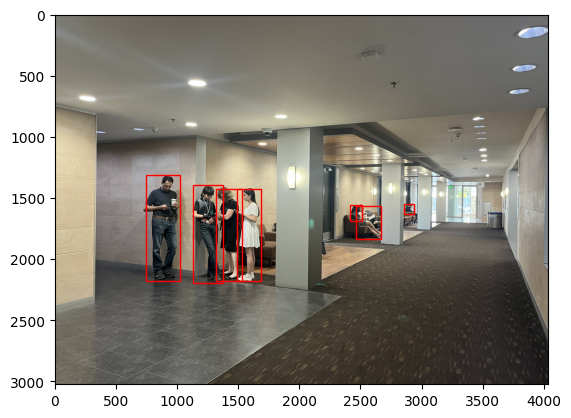

Number of people in Copy of IMG_1711.jpeg: 9


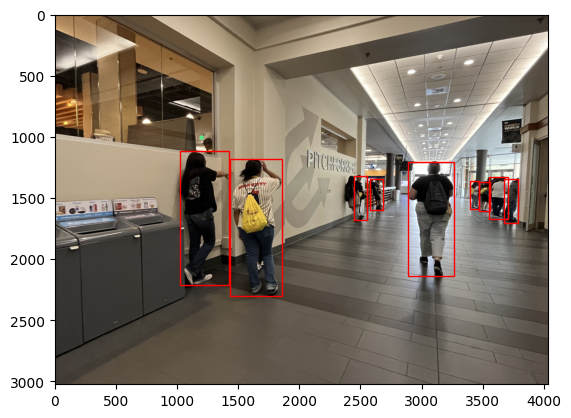

Number of people in Copy of IMG_1714.jpeg: 9


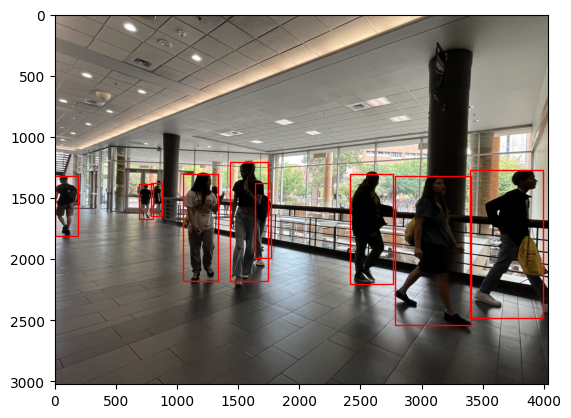

Number of people in Copy of IMG_1746.jpeg: 23


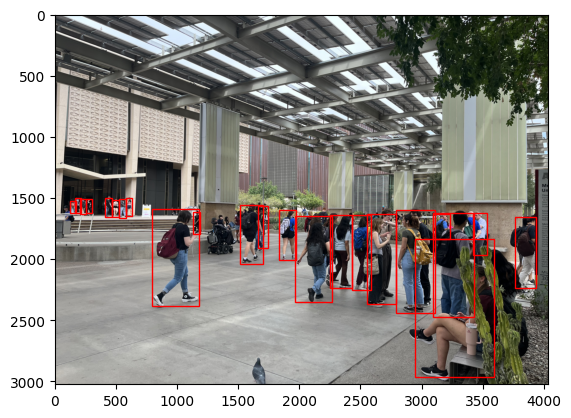

Number of people in Copy of IMG_1738.jpeg: 13


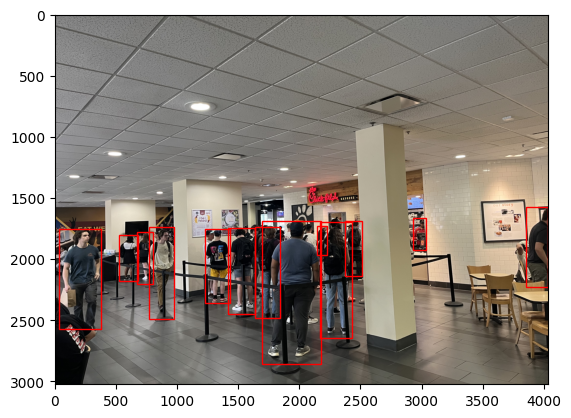

Number of people in Copy of IMG_1744.jpeg: 14


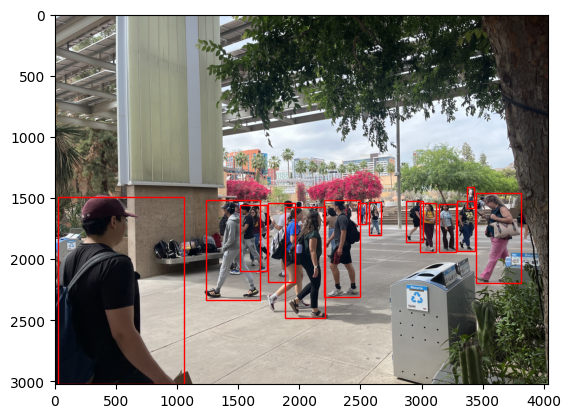

Number of people in Copy of IMG_1748.jpeg: 11


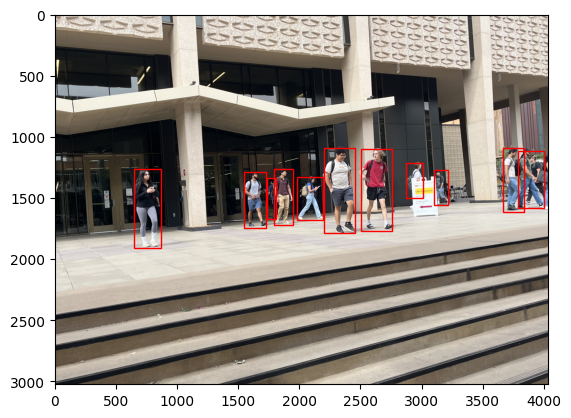

Number of people in Copy of IMG_1735.jpeg: 10


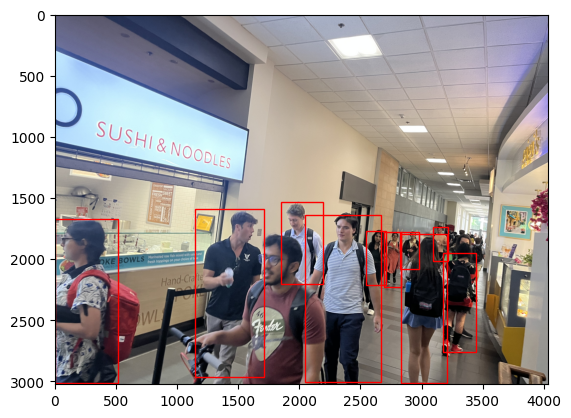

Number of people in Copy of IMG_1731.jpeg: 8


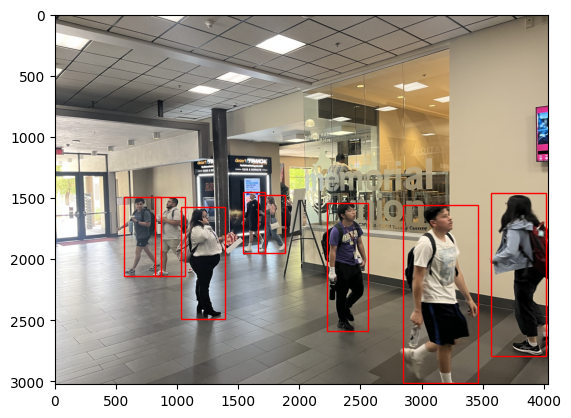

Number of people in Copy of IMG_1721.jpeg: 9


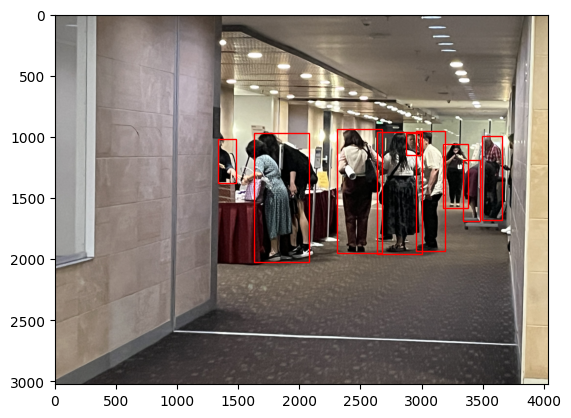

Total Time Taken to Infer 10 Images using RCNN two stage detection model: 126.2099437713623 seconds
CPU times: user 1min 46s, sys: 18.3 s, total: 2min 5s
Wall time: 2min 6s


In [ ]:
%%time

import os
import time  # Add this line to import the time module
import torch
from PIL import Image
from torchvision import transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
def process_directory(directory):
    start_time = time.time()
    for filename in os.listdir(directory):
        if filename.endswith(".jpg") or filename.endswith(".png") or filename.endswith(".jpeg"):  # Check for image files
            image_path = os.path.join(directory, filename)
            image = load_image(image_path)
            final_boxes = detect_people(image)
            num_people = count_people(final_boxes)
            print(f"Number of people in {filename}: {num_people}")
            show_image_with_boxes(image, final_boxes)
    end_time = time.time()
    print(f"Total Time Taken to Infer 10 Images using RCNN two stage detection model: {end_time - start_time} seconds")

# Specify the directory containing the images
image_directory = "/content/drive/MyDrive/CIS 515/Project Career Fair/Dataset/testing"
process_directory(image_directory)


## SEGMENTATION USING MASK RCNN

In [ ]:
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision import transforms
from PIL import Image
import os
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.ops import nms
import numpy as np

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cpu


In [ ]:
# Load a pre-trained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model.to(device)
model.eval()  # Set the model to inference mode


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
# # Define the transformation
# transform = transforms.Compose([
#     transforms.ToTensor(),
# ])
# def load_image(image_path):
#     image = Image.open(image_path).convert("RGB")
#     image = transform(image)  # Apply the transformation
#     return image.to(device)  # Move the image to the device


# Define the transformation with resizing
transform = transforms.Compose([
    transforms.Resize((800, 800)),  # Resize the image to reduce computational load
    transforms.ToTensor(),
])


def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply the transformation
    return image.to(device)  # Move the image to the device




In [ ]:
# def detect_and_segment(image):
#     with torch.no_grad():
#         predictions = model([image])  # Model expects a list of images
#     filtered_boxes, masks = filter_detections(predictions[0])
#     return filtered_boxes, masks


def detect_and_segment(image):
    with torch.no_grad():
        predictions = model([image])  # Model expects a list of images
    filtered_boxes, masks = filter_detections(predictions[0])
    return filtered_boxes, masks


In [ ]:
# def filter_detections(predictions, min_score=0.8, min_area=500):
#     scores = predictions['scores'].to(device)
#     boxes = predictions['boxes'].to(device)
#     labels = predictions['labels'].to(device)
#     masks = predictions['masks'].to(device)
#     areas = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

#     keep = (scores >= min_score) & (labels == 1) & (areas >= min_area)
#     filtered_boxes = boxes[keep]
#     filtered_scores = scores[keep]
#     filtered_masks = masks[keep]

#     keep_indices = nms(filtered_boxes, filtered_scores, iou_threshold=0.3)
#     final_boxes = filtered_boxes[keep_indices]
#     final_masks = filtered_masks[keep_indices]

#     return final_boxes.cpu(), final_masks.cpu()  # Move data back to CPU for matplotlib



def filter_detections(predictions, min_score=0.8, min_area=500):
    scores = predictions['scores'].to(device)
    boxes = predictions['boxes'].to(device)
    labels = predictions['labels'].to(device)
    masks = predictions['masks'].to(device)
    areas = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

    keep = (scores >= min_score) & (labels == 1) & (areas >= min_area)
    filtered_boxes = boxes[keep]
    filtered_scores = scores[keep]
    filtered_masks = masks[keep]

    keep_indices = nms(filtered_boxes, filtered_scores, iou_threshold=0.3)
    final_boxes = filtered_boxes[keep_indices]
    final_masks = filtered_masks[keep_indices]

    return final_boxes.cpu(), final_masks.cpu()  # Move data back to CPU for matplotlib


In [ ]:
# def show_image_with_boxes_and_masks(image, boxes, masks):
#     # Convert tensor to PIL Image and prepare for display
#     pil_img = transforms.ToPILImage()(image.cpu().squeeze())  # Move image data to CPU
#     plt.figure(figsize=(10, 10))
#     plt.imshow(pil_img)
#     ax = plt.gca()
#     mask_color = [0, 1, 0]  # Green color

#     for box, mask in zip(boxes, masks):
#         x, y, w, h = box[0], box[1], box[2] - box[0], box[3] - box[1]
#         rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
#         ax.add_patch(rect)
#         mask = mask.squeeze().numpy()  # Convert the mask tensor to numpy array
#         colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3))
#         for i in range(3):
#             colored_mask[:, :, i] = mask_color[i]
#         ax.imshow(np.dstack((colored_mask, mask * 0.5)))

#     plt.axis('off')
#     plt.show()



def show_image_with_boxes_and_masks(image, boxes, masks):
    pil_img = transforms.ToPILImage()(image.cpu().squeeze())  # Convert tensor to PIL Image for display
    plt.figure(figsize=(10, 10))
    plt.imshow(pil_img)
    ax = plt.gca()
    mask_color = [0, 1, 0]  # Green color for the masks

    for box, mask in zip(boxes, masks):
        x, y, w, h = box[0], box[1], box[2] - box[0], box[3] - box[1]
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        mask = mask.squeeze().numpy()  # Convert the mask tensor to a numpy array
        colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3))
        for i in range(3):
            colored_mask[:, :, i] = mask_color[i]
        ax.imshow(np.dstack((colored_mask, mask * 0.5)))

    plt.axis('off')
    plt.show()


Processed Copy of IMG_1719.jpeg


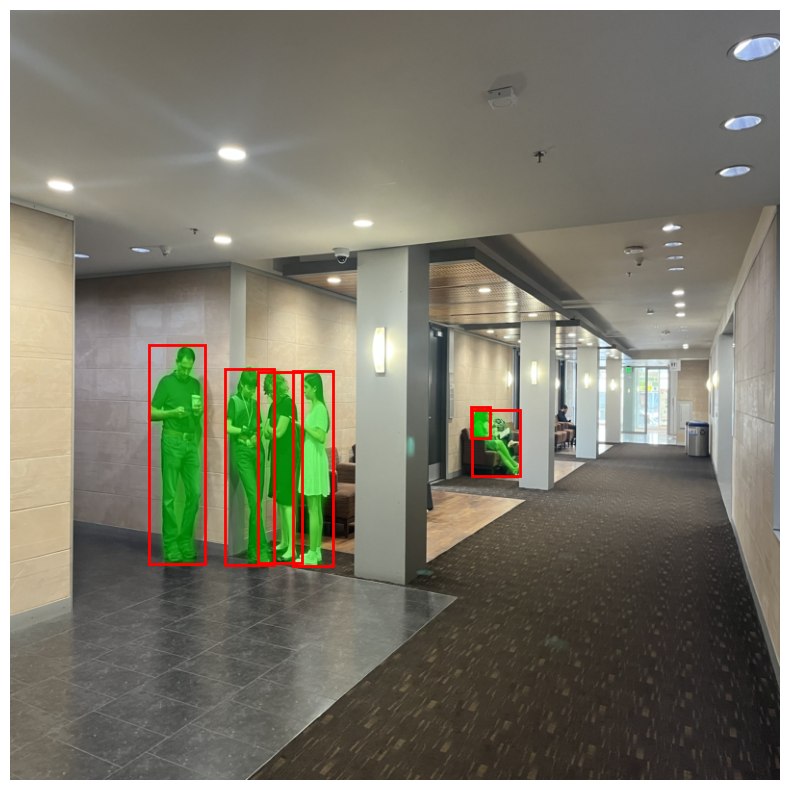

Processed Copy of IMG_1711.jpeg


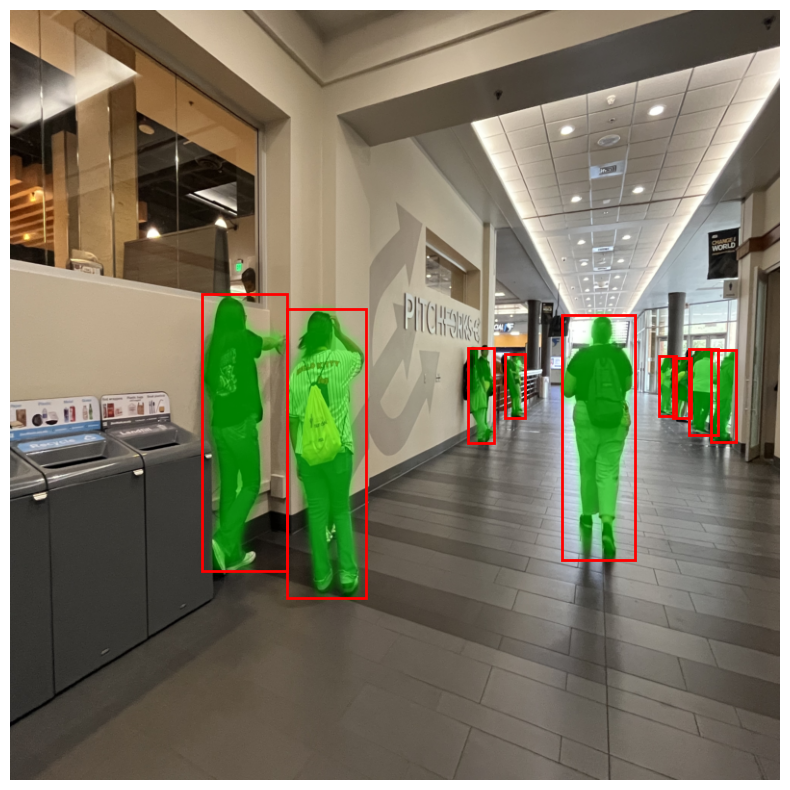

Processed Copy of IMG_1714.jpeg


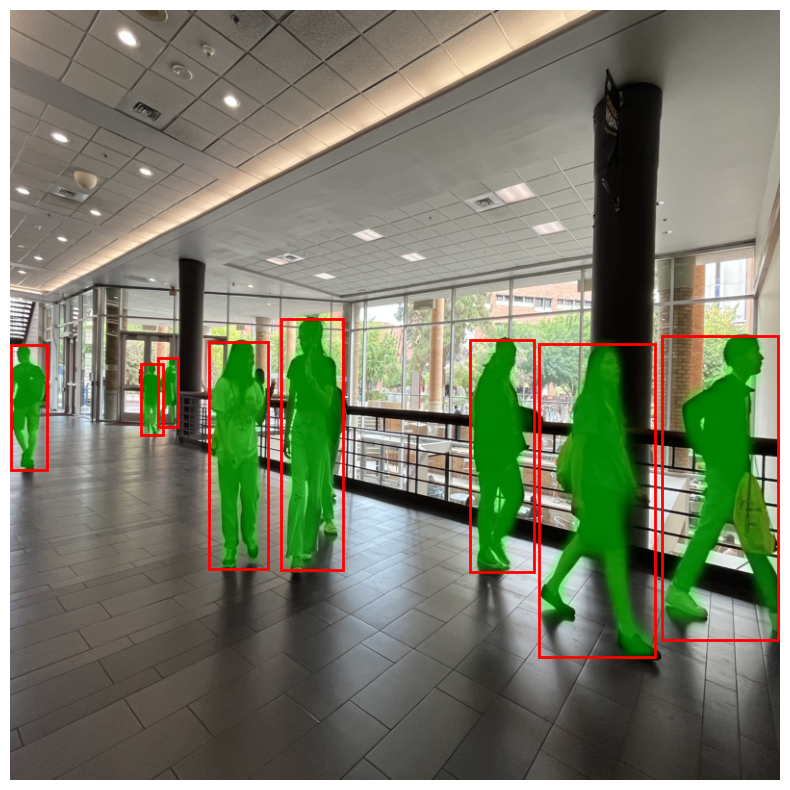

Processed Copy of IMG_1746.jpeg


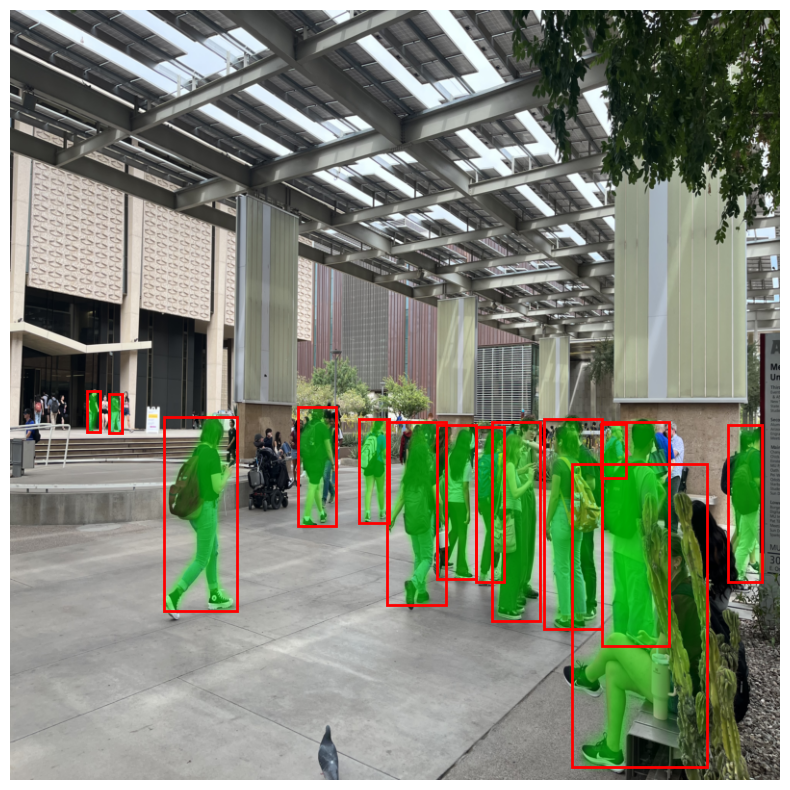

Processed Copy of IMG_1738.jpeg


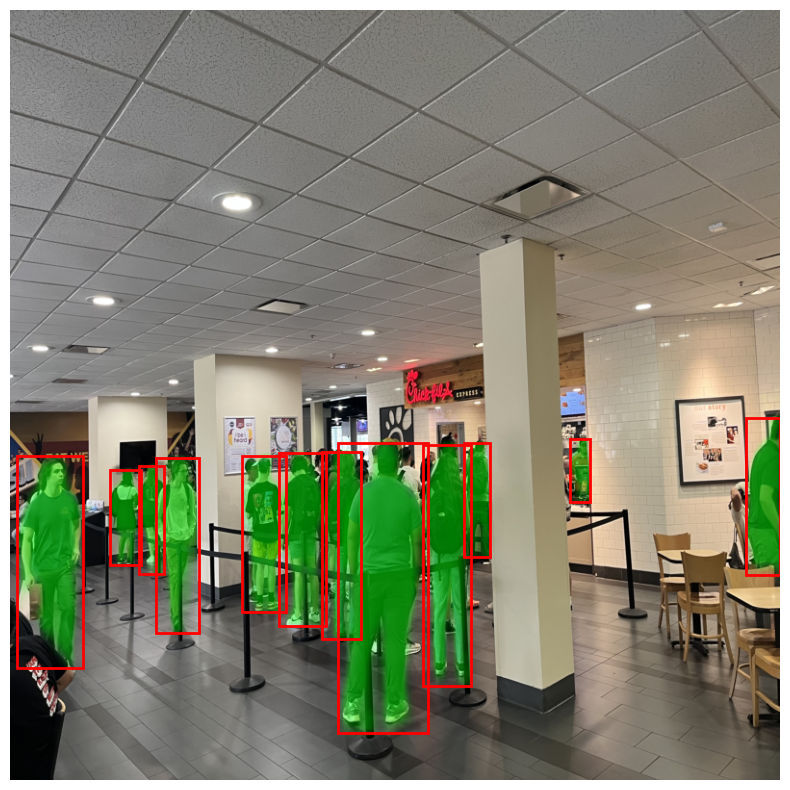

Processed Copy of IMG_1744.jpeg


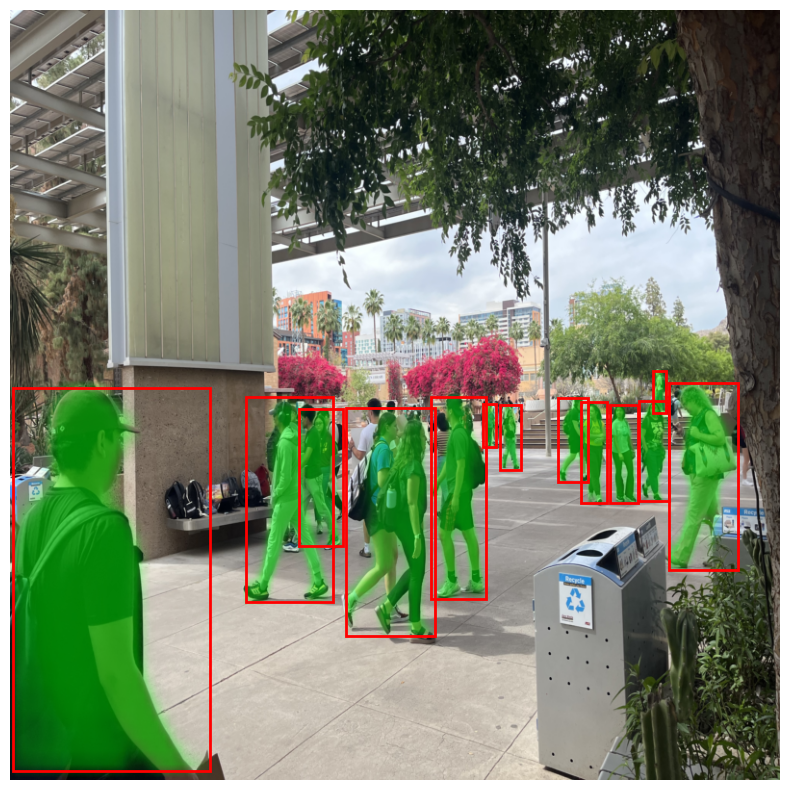

Processed Copy of IMG_1748.jpeg


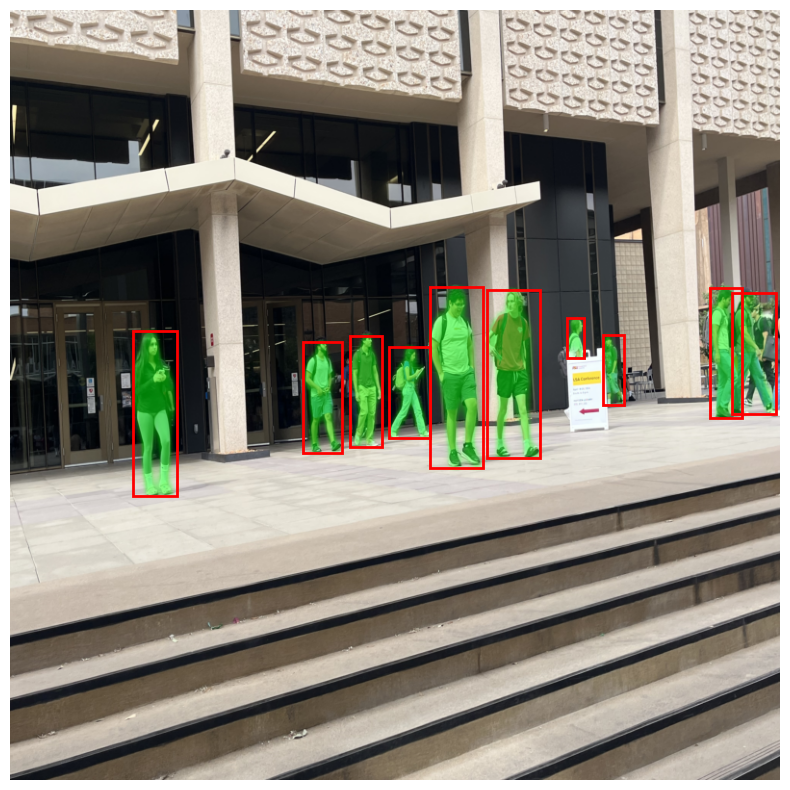

Processed Copy of IMG_1735.jpeg


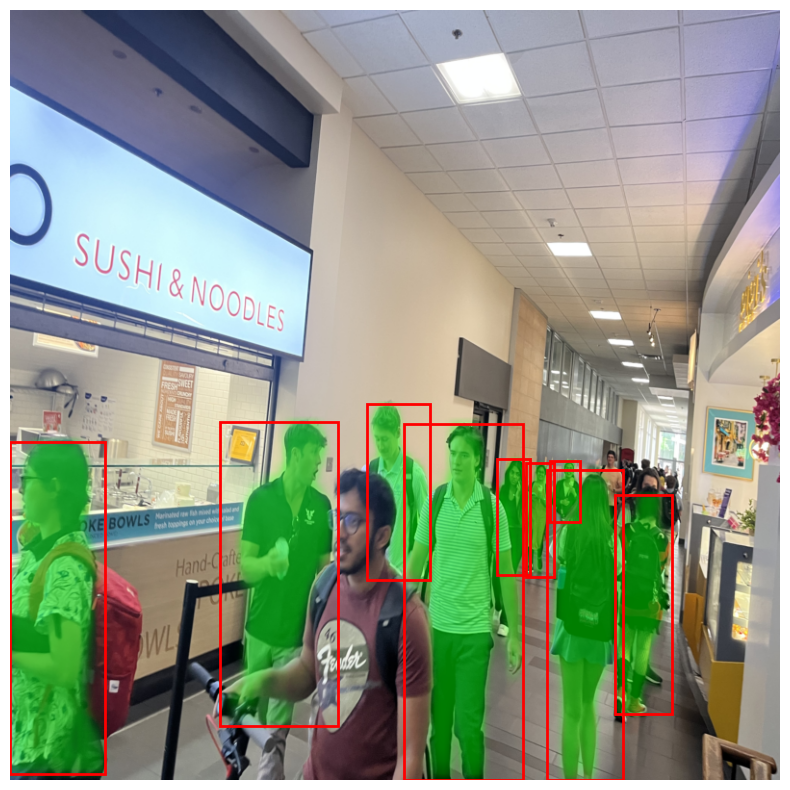

Processed Copy of IMG_1731.jpeg


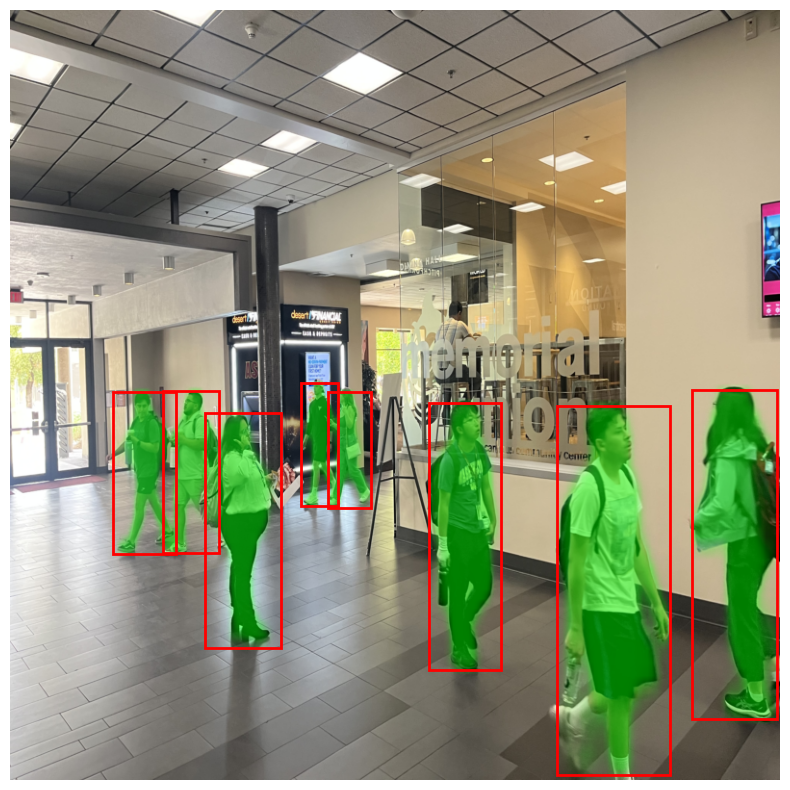

Processed Copy of IMG_1721.jpeg


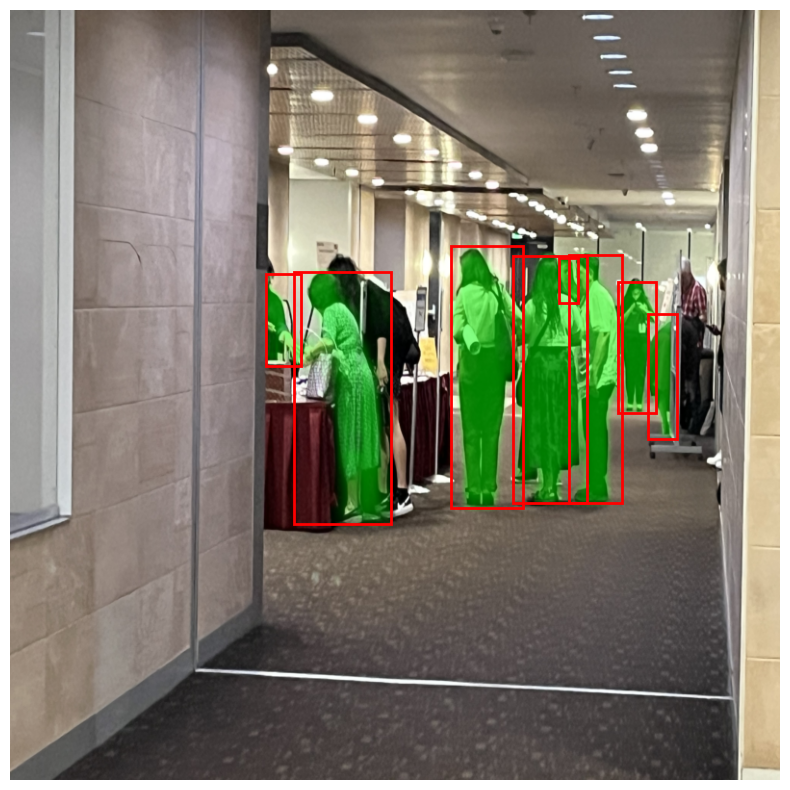

Total Time Taken for Mask R-CNN Segmentation: 134.71899223327637 seconds
CPU times: user 1min 57s, sys: 14.8 s, total: 2min 11s
Wall time: 2min 14s


In [ ]:
%%time

# def process_directory(directory):
#     start_time = time.time()
#     for filename in os.listdir(directory):
#         if filename.lower().endswith((".jpg", ".png", ".jpeg")):
#             image_path = os.path.join(directory, filename)
#             image = load_image(image_path)
#             final_boxes, masks = detect_and_segment(image)
#             print(f"Processed {filename}")
#             show_image_with_boxes_and_masks(image, final_boxes, masks)
#     end_time = time.time()
#     print(f"Total Time Taken for Mask R-CNN Segmentation: {end_time - start_time} seconds")

# # Specify your image directory
# image_directory = '/content/drive/MyDrive/CIS 515/Project Career Fair/Dataset/testing'
# process_directory(image_directory)



def process_directory(directory):
    start_time = time.time()
    for filename in os.listdir(directory):
        if filename.lower().endswith((".jpg", ".png", ".jpeg")):
            image_path = os.path.join(directory, filename)
            image = load_image(image_path)
            final_boxes, masks = detect_and_segment(image)
            print(f"Processed {filename}")
            show_image_with_boxes_and_masks(image, final_boxes, masks)
    end_time = time.time()
    print(f"Total Time Taken for Mask R-CNN Segmentation: {end_time - start_time} seconds")

# Specify your image directory
image_directory = '/content/drive/MyDrive/CIS 515/Project Career Fair/Dataset/testing'
process_directory(image_directory)

## Video Processing3

In [ ]:
!pip install pytube
!pip install moviepy


In [ ]:
from pytube import YouTube

def download_video(youtube_url, output_path):
    yt = YouTube(youtube_url)
    # Select the highest resolution stream available
    stream = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first()
    if stream:
        stream.download(output_path=output_path)
        print(f"Downloaded '{yt.title}' successfully.")
    else:
        print("No suitable stream found.")

# Example Usage
youtube_url = 'https://youtu.be/y1BHV3Eu278'
output_path = '/content/drive/MyDrive/CIS 515/Project Career Fair/test_video/'
download_video(youtube_url, output_path)


Downloaded 'Overview Career and Internship Fair' successfully.


# Video Editing

In [ ]:
from moviepy.editor import VideoFileClip

def clip_video(source_path, start_time, clip_duration, output_path):
    # Load video file
    video = VideoFileClip(source_path)

    # Set the time to start the clip and the duration of the clip
    end_time = start_time + clip_duration

    # Create the clip
    video_clip = video.subclip(start_time, end_time)

    # Write the resulting clip to a file
    video_clip.write_videofile(output_path, codec='libx264')

# Example usage:
source_path = '/content/drive/MyDrive/CIS 515/Project Career Fair/test_video/Overview Career and Internship Fair.mp4'
start_time = 4  # Start at 30 seconds
clip_duration = 10  # Duration of the clip in seconds
output_path = '/content/drive/MyDrive/CIS 515/Project Career Fair/test_video/edited.mp4'
clip_video(source_path, start_time, clip_duration, output_path)


Moviepy - Building video /content/drive/MyDrive/CIS 515/Project Career Fair/test_video/edited.mp4.
MoviePy - Writing audio in editedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /content/drive/MyDrive/CIS 515/Project Career Fair/test_video/edited.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/MyDrive/CIS 515/Project Career Fair/test_video/edited.mp4


# Video segmentation processing

In [ ]:
import cv2
# import torch
import torch
from torchvision import transforms
from torchvision.models.detection import maskrcnn_resnet50_fpn
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.ops import nms



In [ ]:
# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the model
model = maskrcnn_resnet50_fpn(pretrained=True).to(device)
model.eval()

# Define transformation
transform = transforms.Compose([transforms.ToTensor()])

def process_frame(frame):
    # Convert the image color space from BGR to RGB
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(image)

    # Transform and add batch dimension
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        prediction = model(image)

    return prediction[0]

  warnings.warn(

  warnings.warn(msg)



In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.ops import nms
import torch
from torchvision.ops import nms
import numpy as np


def draw_segmentation_map(frame, prediction):
    # Convert the frame to RGB for display purposes
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    output = np.zeros_like(frame_rgb)

    # Unpack the model's prediction
    masks = prediction['masks']
    boxes = prediction['boxes']
    scores = prediction['scores']

    # Apply Non-Maximum Suppression
    keep = nms(boxes, scores, 0.3)
    for i in keep:
        if scores[i] > 0.8:
            # Extract the bounding box and draw a rectangle around the detected object
            box = boxes[i].cpu().numpy().astype(int)
            cv2.rectangle(frame, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 3)

            # Optional: Add mask overlay, if you want both masks and boxes
            mask = masks[i, 0].cpu().numpy()
            thresholded_mask = mask > 0.5
            frame[thresholded_mask] = frame[thresholded_mask] * 0.5 + np.array([0, 255, 0], dtype=np.uint8) * 0.5

    return frame



In [ ]:

def process_video(video_path, output_path):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        return "Failed to open video"

    orig_frame_rate = cap.get(cv2.CAP_PROP_FPS)
    width, height = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    codec = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, codec, orig_frame_rate, (width, height))

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        prediction = process_frame(frame)  # Process each frame through the model
        modified_frame = draw_segmentation_map(frame.copy(), prediction)
        out.write(modified_frame)  # Write the modified frame to the output video

    cap.release()
    out.release()

# Example usage:
video_path = '/content/drive/MyDrive/CIS 515/Project Career Fair/test_video/edited.mp4'
output_path = '/content/drive/MyDrive/CIS 515/Project Career Fair/test_video/pred.mp4'
process_video(video_path, output_path)
